# Support Vector Machines

Recalling from the Logistic Function, the idea was to transform the loss function for the linear regression so that we weigh the far-away points much less so that our spearation hyperplane does not try too hard to get those right. Taken in order to **not be skewed by the outlier in our dataset**

# Goal of SVM

We want to find the **optimal point** in which we can split our data and create a **decision boundary**

**Goal:** We want to **maximize the region between classes** as to have the least or zero amount of misclassifications

<div>
    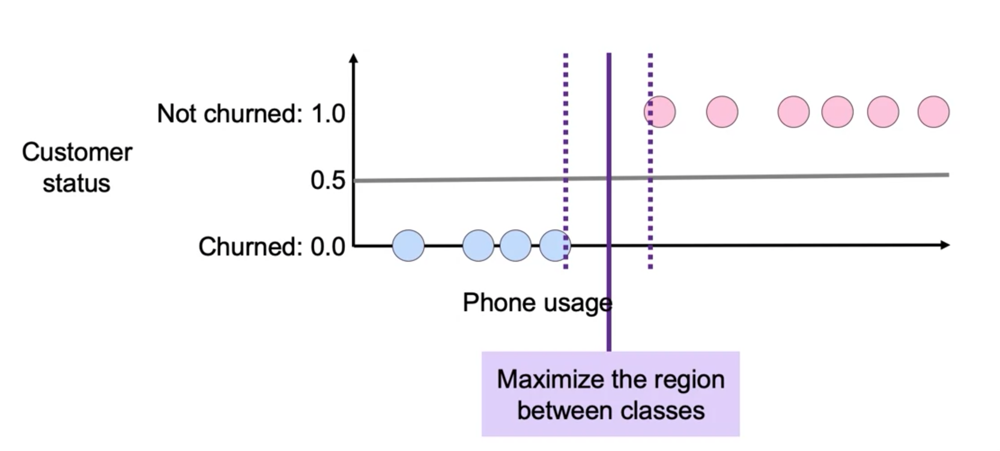
<div/>

where the dotted lines are called **Support Vectors**

<div>
    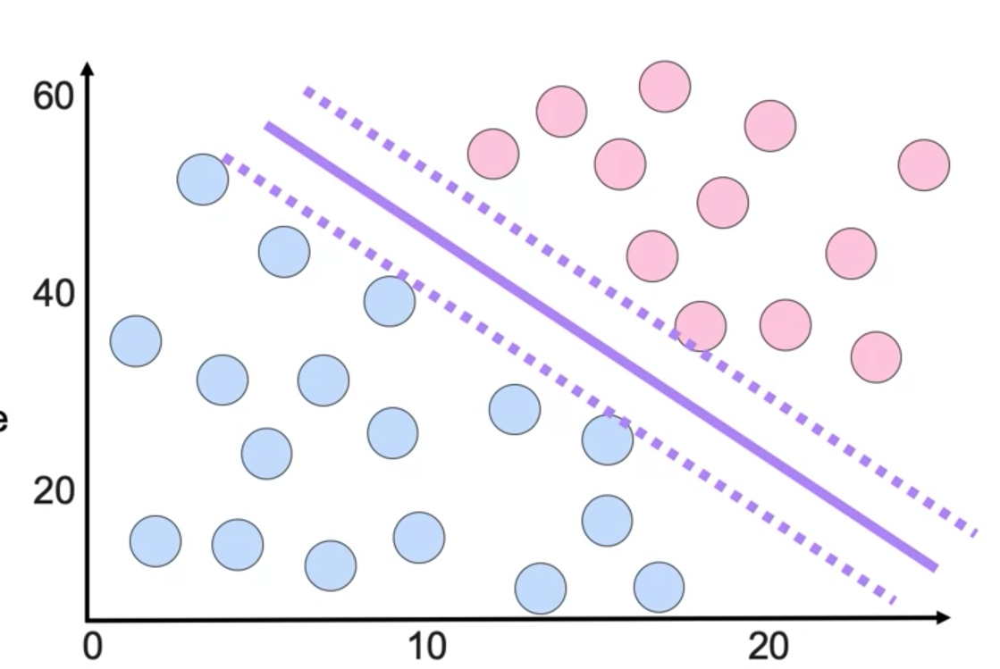
<div/>

Using these support vectors, find the **distance that is furthest from each one of these two groups**

# Cost Function

The cost function SVMs are trying to minimize in order to optimize the solution, to optimize that margin.

<div>
    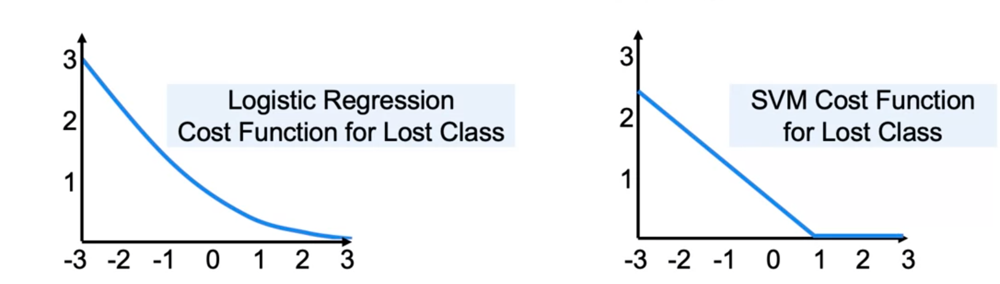
<div/>

In our SVM Cost function, we do not penalize between 1 and 3, meaning we are on the right side of the graph, but as soon as we touch the decision boundary we start to get penalized and the more we moving in the direction of the decision boundary, the more we get penalized:

<div>
    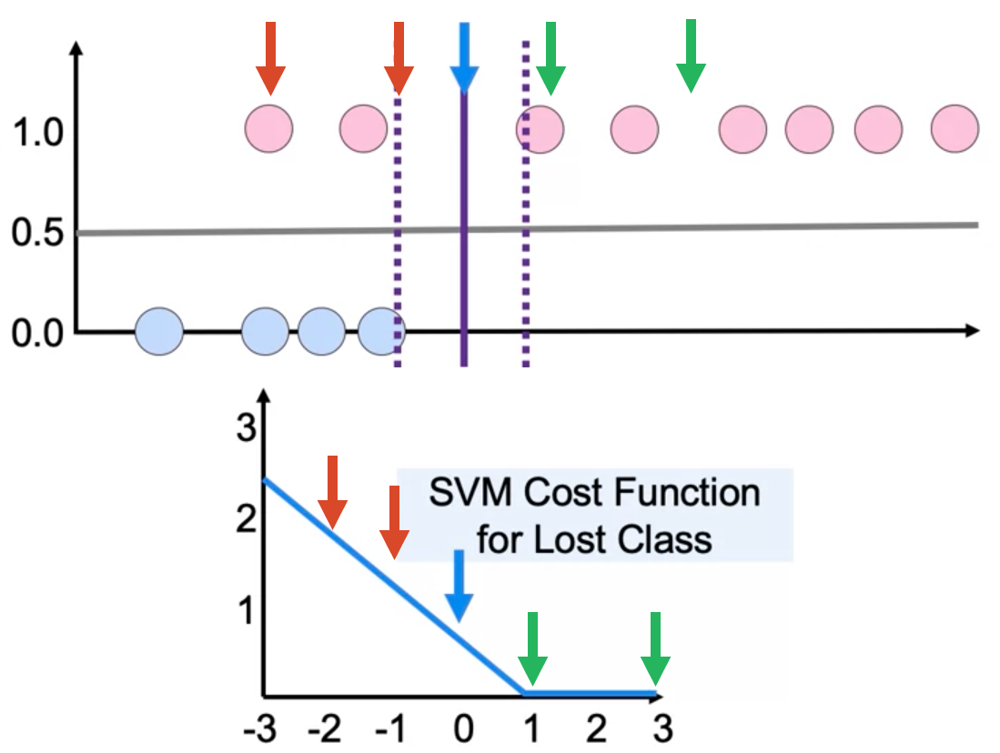
<div/>

## Regularization of SVM

Need to keep original SVM but allow for some objects to be misclassified within the process

$$J(\beta_i) = \text{SVM Cost}(\beta_i) = \frac{1}{C} \sum_i \beta_i$$

We add a term in the cost function (that will try to minimize the size of the coefficients) such that it becomes more costly to get the new right comparied to moving our boundary

SVMs are a **Linear Classifier** and will not return probabilities but will rather return **lables either 0 or 1** and those labels are decided by which side of a certain decision boundary they fall on.

That **Decision Boundary** was initially found by determining the **hyperplane over that line that minimizes the errors** as well as finding the **widest margin** between the two classes.

The boundary was purely decided by the support vectors in our data, by those points that are going to be on the margin.

- The **first term** in our Loss Function is the best boundary that minimizes our misclassifications (hinge loss) i.e. the **Cost for Misclassification**


- The **second term** gives you an added cost to having a bit more of a copmlex decision boundary with higher coefficients.

In the first example we are minimizing the first portion of the cost function but the regularization term is high.

The second example has a less complex decision boundary

<div>
    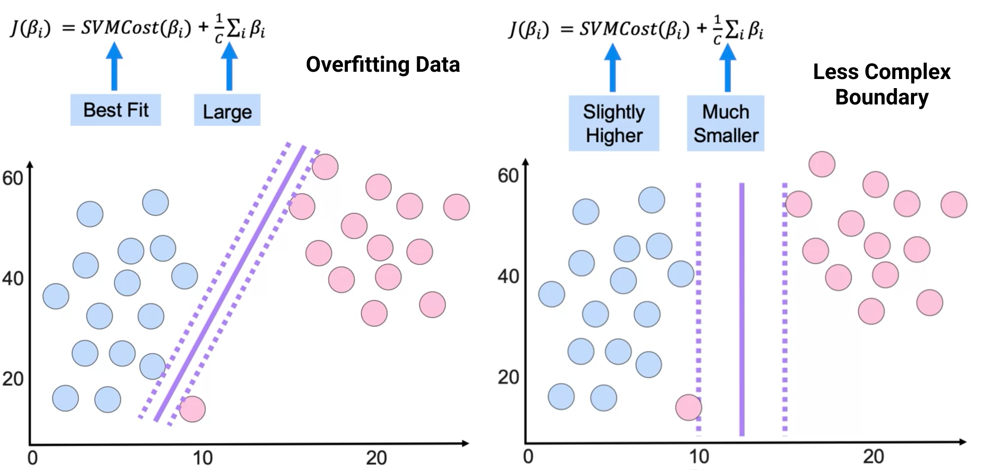
<div/>

The regularization effects can be tweaked by changing $C$

- Smaller $C$ more regularization: the more we penalize for higher coefficients

<div>
    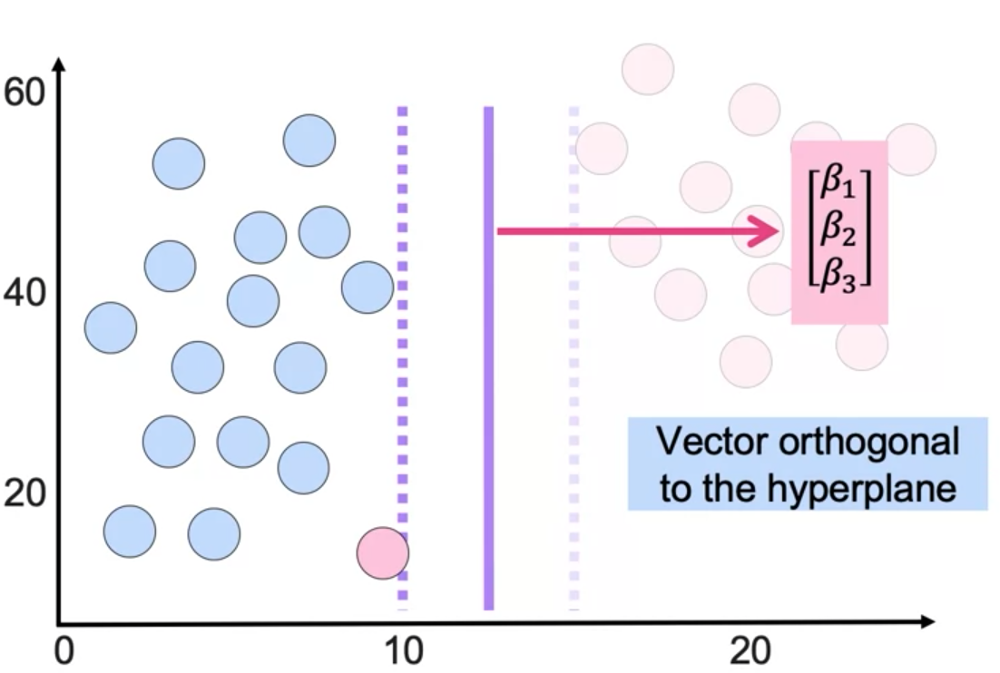
<div/>

The coefficients $\beta$ multiplied by their respective features added up form the **Dot Product** of these coefficients.

These coefficients and their respective features will determine on which side of the decision boundary our label will fall, with values **greater than zero** for this dot product being on class and **less than zero** being the other.

- Dot product = 0 is exactly where the decision boundary lies


- The **Orthogonal Line** will be the value we compute with values further away being larger positive or negative values (depending on the direction th eline points) and the higher the coefficients are the larger the effect each feature has on determining that positive or negative class.

## Python Syntax for SVMs

```python

# Import the class containing the classification method
from sklearn.svm import LinearSVC

# Create an instance of the class
LinSVC = LinearSVC(penalty="l2", c=10.0)

# Fit the instance on the data and then predict the expected value
LinSVC = LinSVC.fit(X_train, y_train)
y_predict = LinSVC.predict(X_test)
```

# Support Vector Machine Kernels

## Kernel Trick to Achieve Non-Linear Decision Boundaries

We need to come up with a linear decision boundary in a higher dimensional space. We will essentially map our original data to higher dimensions with the knowledge that as we increase dimensions we should be able to eventually find some linear decision boundary

**Goal:** to transfrom the data so it is linearly separable

<div>
    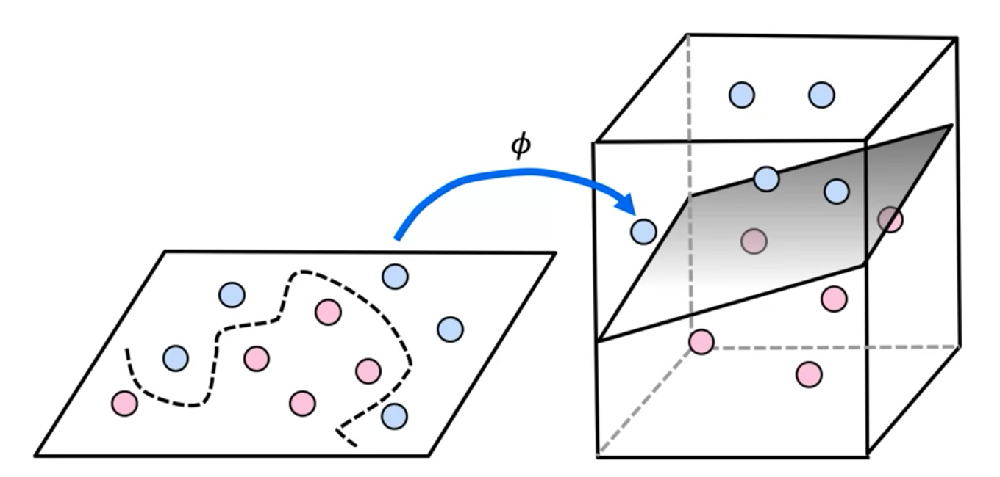
<div/>

## Gaussian Kernels

Goal is to come up with a boundary that is going to separate the data points from one class from those of the other class.

### Approach 1: Polynomial Transformation

We create from our original two features, three additional features, the square of the two plus the interaction term

<div>
    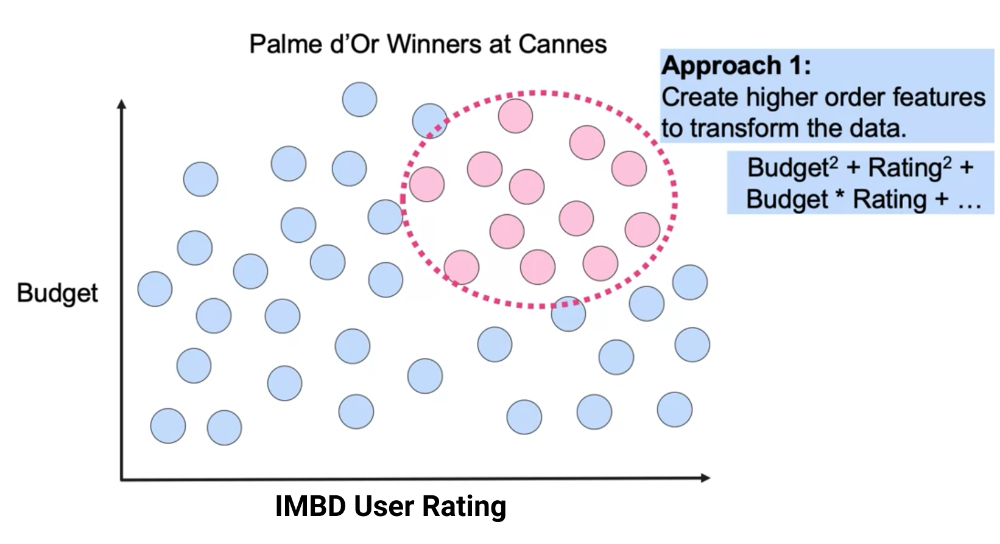
<div/>

### Approach 2: Transform the space to a different coordinate system

We will define **Similarity Functions** and use them to transform our space to higher dimensions.

Lets say we are trting to identify the winners of the top awardsa the Cannes Film Festival **budget** and **IMBD Ratings**. We can look to each one of our movies in the dataset and to each we look at the **Similarity Score** to each one of our different movies.

<div>
    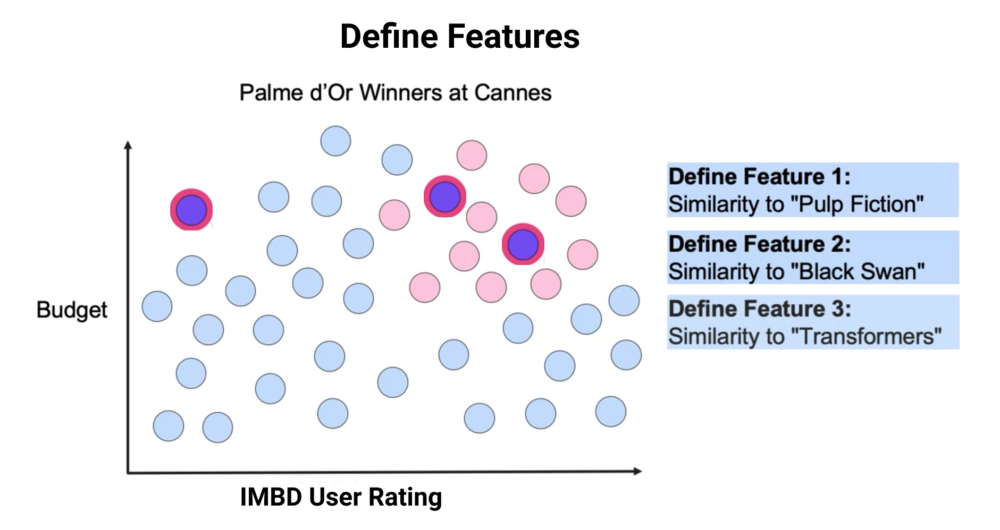
<div/>

### Creating Gaussian Functions

We create GFs to define the similarity given our features (our featurs of another movie to this movie, how similar it is) 

<div>
    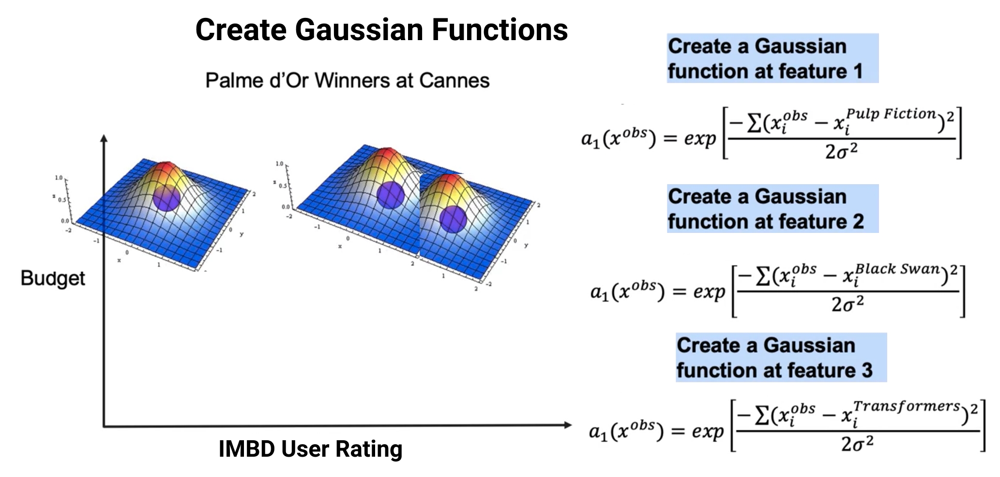
<div/>

### Radial Basis Function

We can create three separate radial basis function from our Gaussian functions, with:

- $a_1, a_2, a_3$ representing the similarities to the different movies in our dataset (Pulp Fiction, Black Swan and Transformers)

<div>
    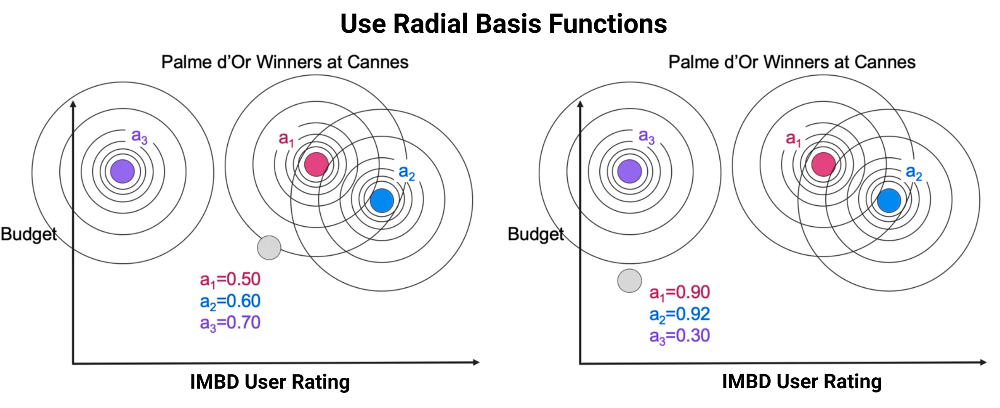
<div/>

- We can use these numbers in order to map our original space of just budegt and ratings to three dimensions where those three dimensions are the 3 values of a

This will ensure that the similar movies are closed together once we map them to higher-dimensional space, making it easier to find this **linear hyperplane** to separate them out.

## Dimensional Mapping

### The Transformation:

$$ \begin{bmatrix} x_1  & x_2 \end{bmatrix} \rightarrow \begin{bmatrix} a_1  & a_2 & a_3\end{bmatrix}$$

<div>
    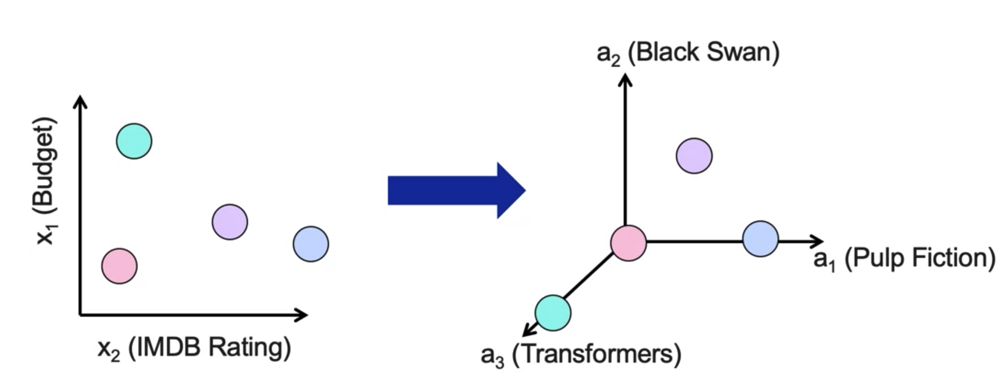
<div/>

With $a_i$, $i=1,2,3$ being the similarity to each of the respective movies. We can map this up to three-dimensional space.

With this new three-dimensional space we can find a linear plane shown below that will. **classify the award winners vs. the non-award winners particularly well**.

<div>
    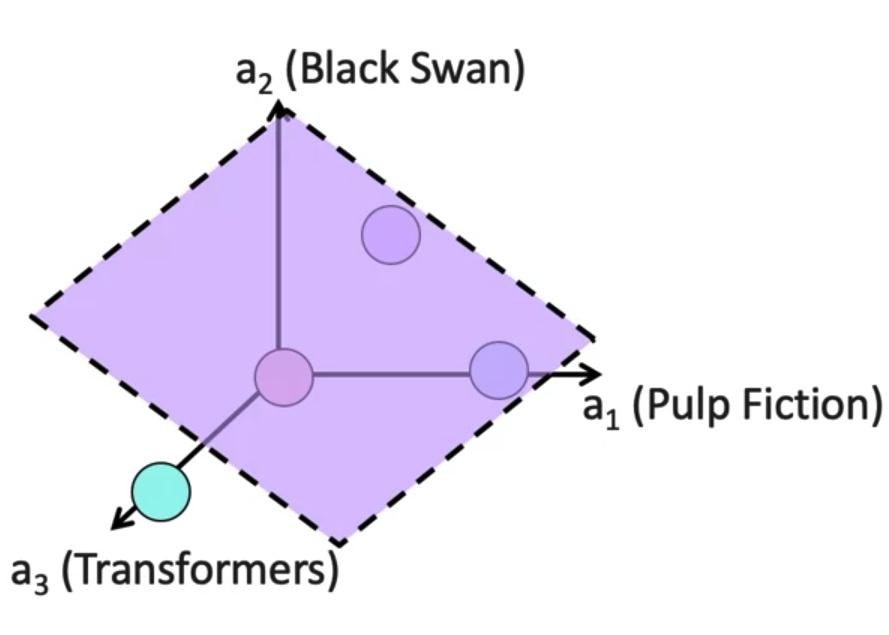
<div/>

### In Two-Dimensional Space

We have each of these similarity measures which are determined by the **Radial Basis Function** that will help us create the clusters that are close together in higher dimensional space.

These clusters will be **Linearly Separable**, generally, once we move to that higher dimensional space.

- We can map this in higher than three dimensions whithout the computational inefficiencies that are required to actually map our data to those higher dimensional spaces

<div>
    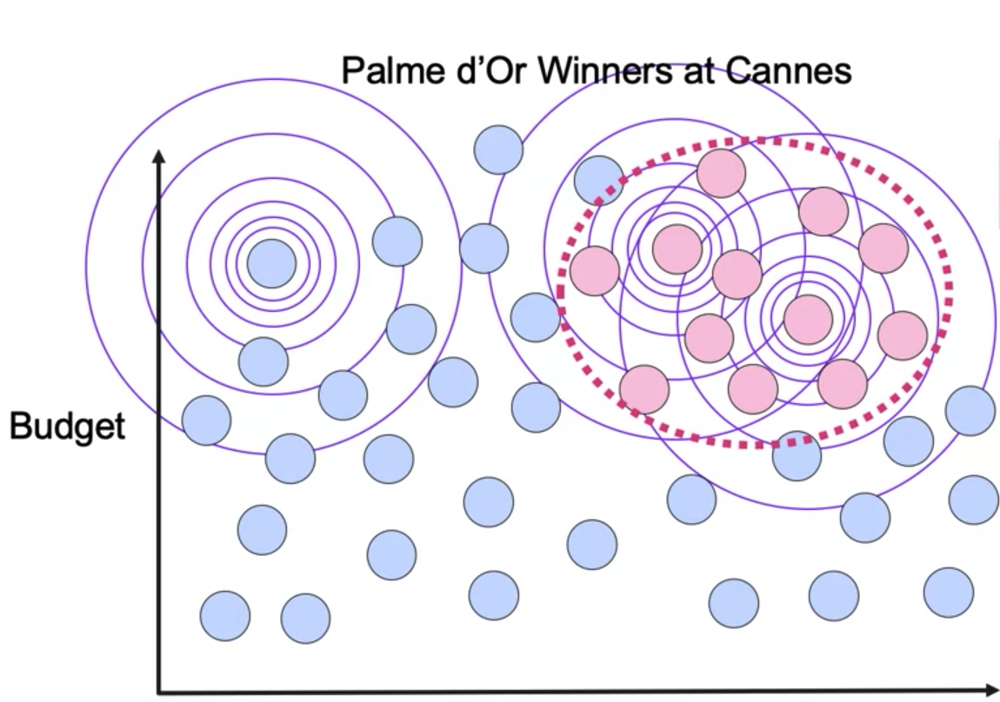
<div/>

## Python Syntax for Kernal SVMs

```python

# Import the class containing the classification method
from sklearn.svm import SVC

# Create an instance of the class
## C is the penalty associated with the error term
## gamma is a regularization term (lower values means more regularization, same with C)
rbfSVC = SVC(kernel="rbf", gamma=1.0, C=10.0) 

# Fit the instance on the data and then predict the expected value
rbfSVC = rbfSVC.fit(X_train, y_train)
y_predict = rbfSVC.predict(X_test)
```

# SVMs in Practice

### Problem:

SVMs and RBF Kernels are very slow to train with lots of features or data

How to approximate the kernel?

### Data Collection

Construct approximate kernal maps with SGD using Nystroeam or RBF sampler then we can fit a linear classifier

<div>
    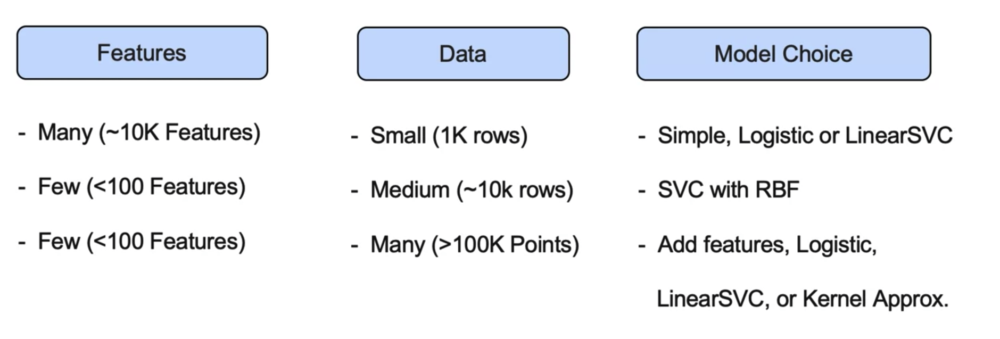
<div/>

# Support Vector Machines in Practice

We will be using the wine quality data set for these exercises. This data set contains various chemical properties of wine, such as acidity, sugar, pH, and alcohol. It also contains a quality metric (3-9, with highest being better) and a color (red or white). The name of the file is `Wine_Quality_Data.csv`.

In [2]:
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns

## Setup

* Import the data.


* Create the target variable `y` as a 1/0 column where 1 means red.


* Create a `pairplot` for the dataset.


* Create a bar plot showing the correlations between each column and `y`


* Pick the most 2 correlated fields (using the absolute value of correlations) and create `X`


* Use MinMaxScaler to scale `X`. Note that this will output a np.array. Make it a DataFrame again and rename the columns appropriately.

In [3]:
filepath = 'Wine_Quality_Data.csv'
data = pd.read_csv(filepath, sep=',')

In [5]:
# transform Y into a binary red 1 not red 0
y = (data['color'] == 'red').astype(int)
fields = list(data.columns[:-1])  # everything except "color"

# take correlations
correlations = data[fields].corrwith(y)
correlations.sort_values(inplace=True)
correlations

total_sulfur_dioxide   -0.700357
free_sulfur_dioxide    -0.471644
residual_sugar         -0.348821
citric_acid            -0.187397
quality                -0.119323
alcohol                -0.032970
pH                      0.329129
density                 0.390645
fixed_acidity           0.486740
sulphates               0.487218
chlorides               0.512678
volatile_acidity        0.653036
dtype: float64

In [6]:
sns.set_context('talk')
sns.set_style('white')

We can clearly see there is some sort of separation in the data of our pair plot so we can come up with a classifier

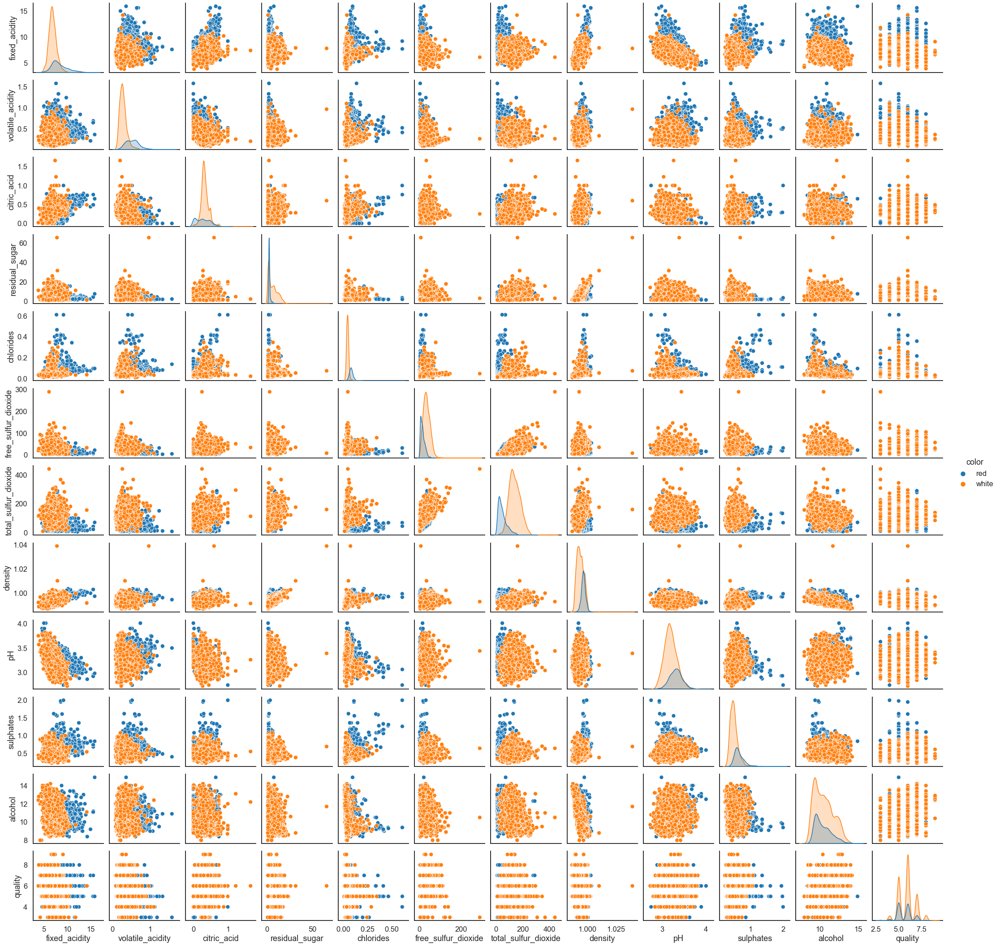

In [7]:
sns.pairplot(data, hue='color')

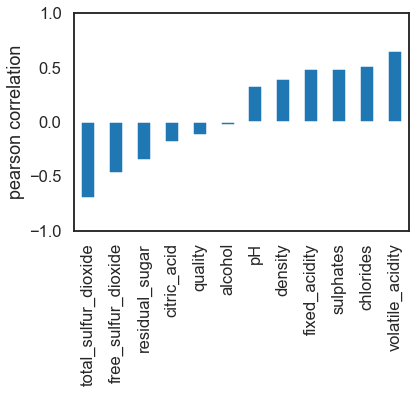

In [9]:
ax = correlations.plot(kind='bar')
ax.set(ylim=[-1, 1], ylabel='pearson correlation');

In [10]:
from sklearn.preprocessing import MinMaxScaler

# get top 2 correlations
fields = correlations.map(abs).sort_values().iloc[-2:].index
print(fields)

# Scale X (same as KNN we need to scale as distance matters)
X = data[fields]
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

X = pd.DataFrame(X, columns=['%s_scaled' % fld fbor fld in fields])
print(X.columns)

Index(['volatile_acidity', 'total_sulfur_dioxide'], dtype='object')
Index(['volatile_acidity_scaled', 'total_sulfur_dioxide_scaled'], dtype='object')


In [12]:
X.head()

,volatile_acidity_scaled,total_sulfur_dioxide_scaled
0,0.413333,0.064516
1,0.533333,0.140553
2,0.453333,0.110599
3,0.133333,0.124424
4,0.413333,0.064516


# Linear Decision Boundary

Our goal is to look at the decision boundary of a LinearSVC classifier on this dataset. Check out [this example](http://scikit-learn.org/stable/auto_examples/svm/plot_iris.html#sphx-glr-auto-examples-svm-plot-iris-py) in sklearn's documentation. 

* Fit a Linear Support Vector Machine Classifier to `X`, `y`.


* Pick 300 samples from `X`. Get the corresponding `y` value. Store them in variables `X_color` and `y_color`. This is because original dataset is too large and it produces a crowded plot.


* Modify `y_color` so that it has the value "red" instead of 1 and 'yellow' instead of 0.


* Scatter plot X_color's columns. Use the keyword argument "color=y_color" to color code samples.


* Use the code snippet below to plot the decision surface in a color coded way.

```python
x_axis, y_axis = np.arange(0, 1, .005), np.arange(0, 1, .005)
xx, yy = np.meshgrid(x_axis, y_axis)
xx_ravel = xx.ravel()
yy_ravel = yy.ravel()
X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
y_grid_predictions = *[YOUR MODEL]*.predict(X_grid)
y_grid_predictions = y_grid_predictions.reshape(xx.shape)
ax.contourf(xx, yy, y_grid_predictions, cmap=colors, alpha=.3)
```

With LinearSVC, it is easy to experiment with different parameter choices and see the decision boundary.

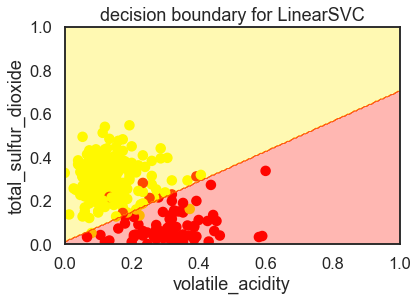

In [13]:
from sklearn.svm import LinearSVC

# initial model and fit on every single data point
LSVC = LinearSVC()
LSVC.fit(X, y)

# get only a random sample
X_color = X.sample(300, random_state=45)

# set y_color to just the same exact values with that same index we just identified (x_color and y_color will match up)
y_color = y.loc[X_color.index]

# map r as being our input red and everything else be yellow
y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')

# initiate bounding boxes and plot the scatter of x_color with colors being the red and yellow from y_color
ax = plt.axes()
ax.scatter(
    X_color.iloc[:, 0], X_color.iloc[:, 1],
    color=y_color, alpha=1)

# -------------------------------------------------------

# Get Decision Boundary

# array of values
x_axis, y_axis = np.arange(0, 1.005, .005), np.arange(0, 1.005, .005)

# pass this into a meshgrid (for every single row we will repeat that x and y multiple times)
## this will allow us to look along this grid and see what the outcome will be for each of the x and y values
xx, yy = np.meshgrid(x_axis, y_axis)

# use ravel to have all these groupings into one long array
xx_ravel = xx.ravel()
yy_ravel = yy.ravel()

# put everything into a dataframe and transpose
X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T

# predict
y_grid_predictions = LSVC.predict(X_grid)

# reshape so it is the same shape as our xx.shape
y_grid_predictions = y_grid_predictions.reshape(xx.shape)

# plot countour plot and for each xx,yy we can pass the predictions
ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)

# -------------------------------------------------------

ax.set(
    xlabel=fields[0],
    ylabel=fields[1],
    xlim=[0, 1],
    ylim=[0, 1],
    title='decision boundary for LinearSVC');

# Gaussian Kernel

Let's now fit a Gaussian kernel SVC and see how the decision boundary changes.

* Consolidate the code snippets in Question 2 into one function which takes in an estimator, `X` and `y`, and produces the final plot with decision boundary. The steps are:
    <ol>
     <li> fit model
     <li> get sample 300 records from X and the corresponding y's
     <li> create grid, predict, plot using ax.contourf
     <li> add on the scatter plot
    </ol>
* After copying and pasting code, the finished function uses the input `estimator` and not the LinearSVC model.
* For the following values of `gamma`, create a Gaussian Kernel SVC and plot the decision boundary.  
`gammas = [.5, 1, 2, 10]`
* Holding `gamma` constant, we plot the decision boundary for various values of `C`: 
`[.1, 1, 10]`

In [14]:
def plot_decision_boundary(estimator, X, y):
    # estimator is used so we can fit different models
    estimator.fit(X, y)
    X_color = X.sample(300)
    y_color = y.loc[X_color.index]
    y_color = y_color.map(lambda r: 'red' if r == 1 else 'yellow')
    x_axis, y_axis = np.arange(0, 1, .005), np.arange(0, 1, .005)
    xx, yy = np.meshgrid(x_axis, y_axis)
    xx_ravel = xx.ravel()
    yy_ravel = yy.ravel()
    X_grid = pd.DataFrame([xx_ravel, yy_ravel]).T
    y_grid_predictions = estimator.predict(X_grid)
    y_grid_predictions = y_grid_predictions.reshape(xx.shape)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.contourf(xx, yy, y_grid_predictions, cmap=plt.cm.autumn_r, alpha=.3)
    ax.scatter(X_color.iloc[:, 0], X_color.iloc[:, 1], color=y_color, alpha=1)
    ax.set(
        xlabel=fields[0],
        ylabel=fields[1],
        title=str(estimator))

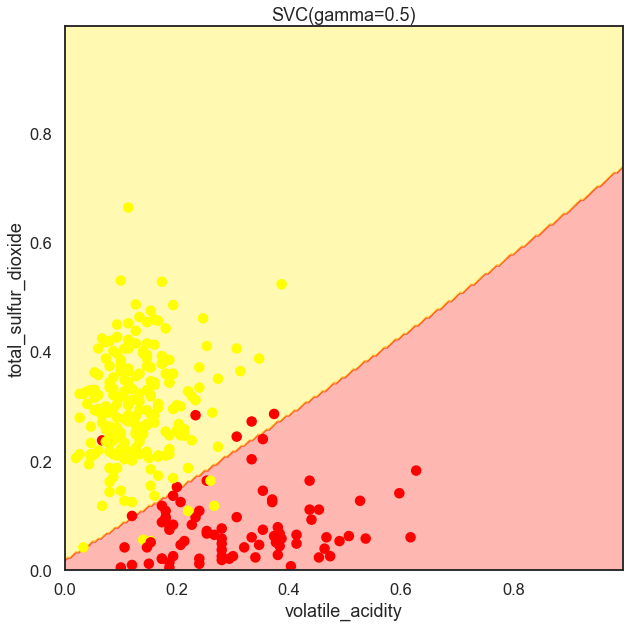

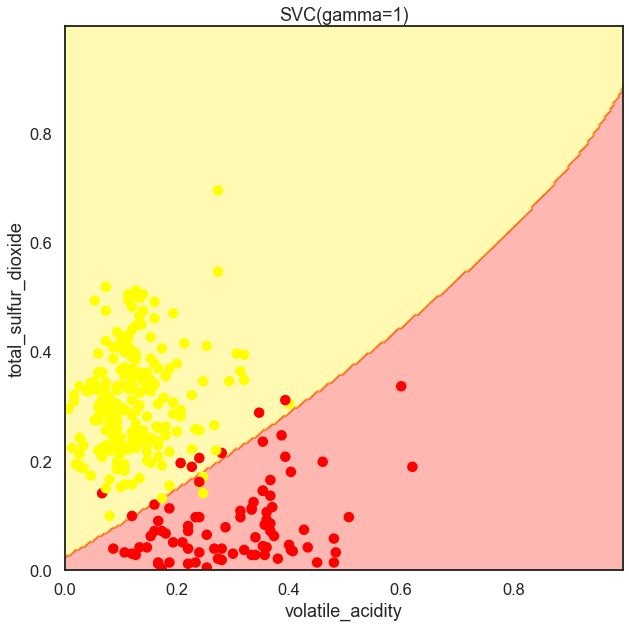

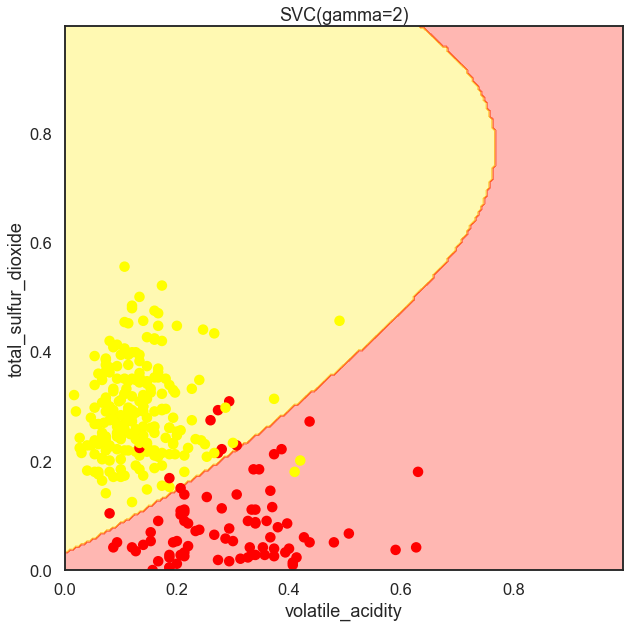

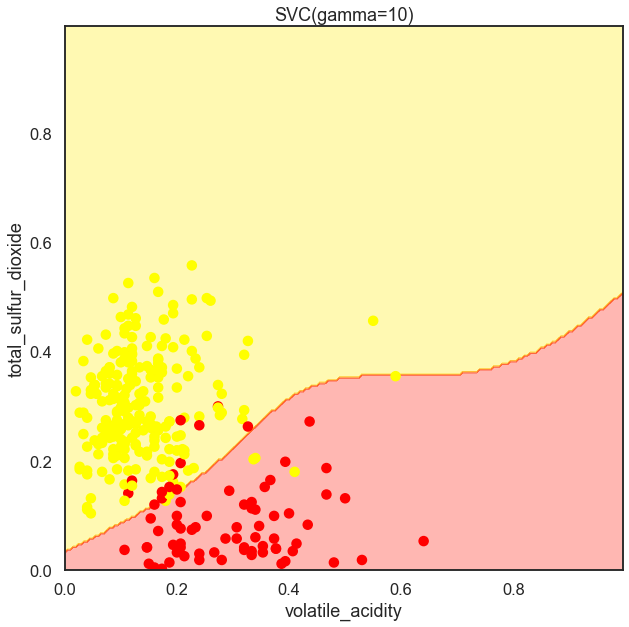

In [15]:
from sklearn.svm import SVC

# Regularization
gammas = [.5, 1, 2, 10]
for gamma in gammas:
    SVC_Gaussian = SVC(kernel='rbf', gamma=gamma)
    plot_decision_boundary(SVC_Gaussian, X, y)

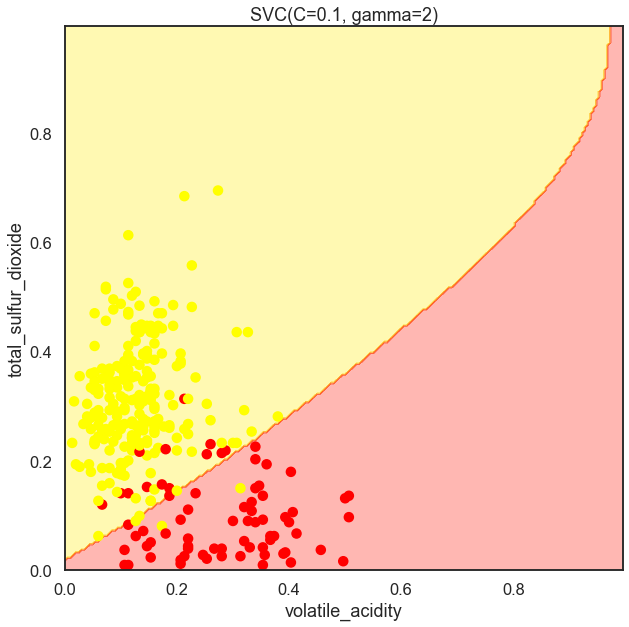

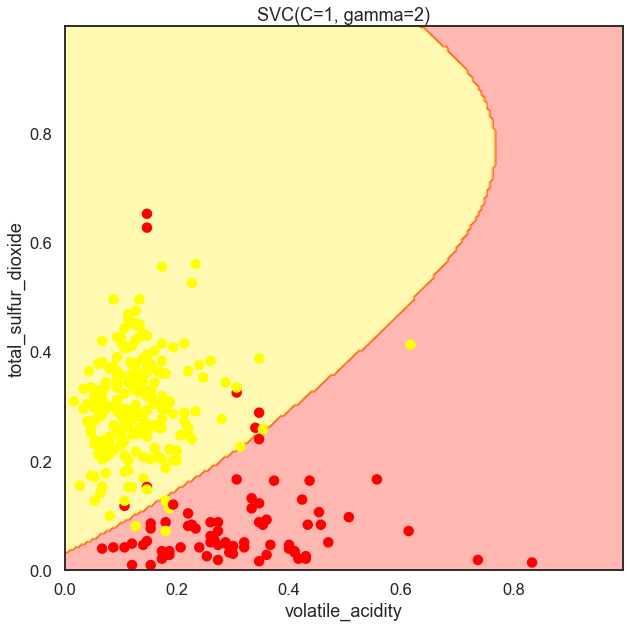

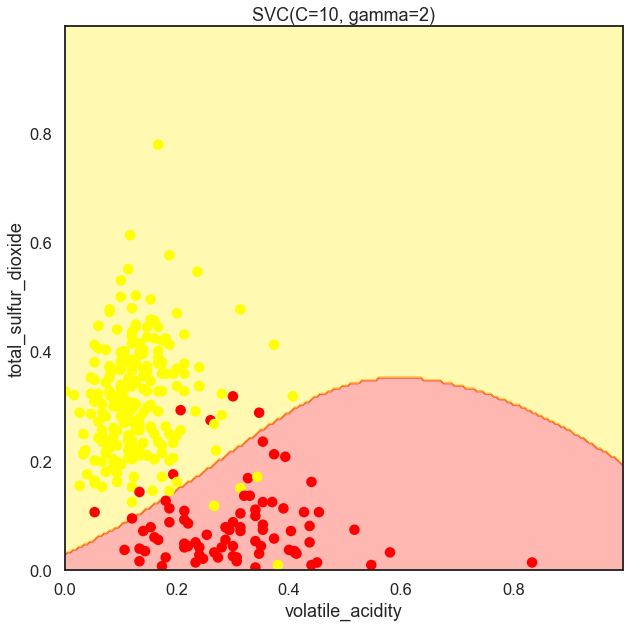

In [16]:
Cs = [.1, 1, 10]
for C in Cs:
    SVC_Gaussian = SVC(kernel='rbf', gamma=2, C=C)
    plot_decision_boundary(SVC_Gaussian, X, y)

# Comparing Kernel Execution Times

We will now compare the fitting times between SVC vs Nystroem with rbf kernel.  
<br><br>
Jupyter Notebooks provide a useful magic function **`%timeit`** which executes a line and prints out the time it took to fit. If we type **`%%timeit`** in the beginning of the cell, it will output the execution time.

We proceed with the following steps:
* Create `y` from data.color, and `X` from the rest of the columns.
* Use `%%timeit` to get the time for fitting an SVC with rbf kernel.
* Use `%%timeit` to get the time for the following: fit_transform the data with Nystroem and then fit a SGDClassifier.

Nystroem+SGD will take much shorter to fit. This difference will be more pronounced if the dataset was bigger.

* Make 5 copies of X and concatenate them
* Make 5 copies of y and concatenate them
* Compare the time it takes to fit the both methods above

In [17]:
from sklearn.kernel_approximation import Nystroem
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

y = data.color == 'red'
X = data[data.columns[:-1]]

kwargs = {'kernel': 'rbf'}
svc = SVC(**kwargs)
nystroem = Nystroem(**kwargs)
sgd = SGDClassifier()

In [18]:
%%timeit
svc.fit(X, y)

462 ms ± 26.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Faster

In [19]:
%%timeit
X_transformed = nystroem.fit_transform(X)
sgd.fit(X_transformed, y)

62.5 ms ± 5.56 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Increase the data set by 5 and run:

In [20]:
X2 = pd.concat([X]*5)
y2 = pd.concat([y]*5)

print(X2.shape)
print(y2.shape)

(32485, 12)
(32485,)


Slower

In [21]:
%timeit svc.fit(X2, y2)

11.2 s ± 213 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Faster

In [22]:
%%timeit
X2_transformed = nystroem.fit_transform(X2)
sgd.fit(X2_transformed, y2)

189 ms ± 6.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
